In [1]:
!pip install transformers peft wandb torch torchvision
!pip install git+https://github.com/jaisidhsingh/LoRA-CLIP.git

!pip install ftfy regex tqdm nltk peft wandb weave
# !pip install git+https://github.com/openai/CLIP.git
!pip install --upgrade -q accelerate bitsandbytes
!pip install git+https://github.com/huggingface/transformers.git
from transformers import AutoProcessor, LlavaForConditionalGeneration
from transformers import BitsAndBytesConfig
import torch
import torch.nn as nn
from torchvision import transforms, datasets
from torch.utils.data import Dataset, DataLoader, random_split
# import clip
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import os, json
import pandas as pd
from tqdm import tqdm
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split
import nltk

from peft import LoraConfig, get_peft_model
from transformers import CLIPProcessor, CLIPModel


nltk.download('punkt_tab')

  Cloning https://github.com/jaisidhsingh/LoRA-CLIP.git to /tmp/pip-req-build-bnzz4lmk
  Running command git clone --filter=blob:none --quiet https://github.com/jaisidhsingh/LoRA-CLIP.git /tmp/pip-req-build-bnzz4lmk
  Resolved https://github.com/jaisidhsingh/LoRA-CLIP.git to commit a60af3b32899bb87bb34ae4a5868ad6745549f62
  Preparing metadata (setup.py) ... done
  Cloning https://github.com/huggingface/transformers.git to /tmp/pip-req-build-2bpszczr
  Running command git clone --filter=blob:none --quiet https://github.com/huggingface/transformers.git /tmp/pip-req-build-2bpszczr
  Resolved https://github.com/huggingface/transformers.git to commit 706703bba6c920b10aa7e7ee8163b06a8a03c450
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done


[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


True

In [2]:
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

dataset_path = "/content/drive/MyDrive/Bird-Species-Exploration-and-Retrieval/Dataset"

if os.path.exists(dataset_path):
  print(f"✅ CUB dataset is available at: {dataset_path}")
else:
  print("❌ Dataset not found! Run the download script first.")

Mounted at /content/drive
❌ Dataset not found! Run the download script first.


In [ ]:
# Load the CUB-200-2011 dataset
def load_cub_dataset(data_dir):
    images = pd.read_csv(os.path.join(data_dir, 'images.txt'), sep=' ', names=['image_id', 'file_path'])
    labels = pd.read_csv(os.path.join(data_dir, 'image_class_labels.txt'), sep=' ', names=['image_id', 'class_id'])
    classes = pd.read_csv(os.path.join(data_dir, 'classes.txt'), sep=' ', names=['class_id', 'class_name'])
    bounding_boxes = pd.read_csv(os.path.join(data_dir, 'bounding_boxes.txt'), sep=' ', names=['image_id', 'x', 'y', 'width', 'height'])
    part_locs = pd.read_csv(os.path.join(data_dir, 'parts/part_locs.txt'), sep=' ', names=['img_id', 'part_id', 'x', 'y', 'visible'])
    # parts = pd.read_csv(os.path.join(data_dir, 'parts/parts.txt'), delimiter =' ', names=['part_id', 'part_name'])
    parts = pd.read_fwf(os.path.join(data_dir, 'parts/parts.txt'), colspecs=[(0, 2), (2, None)], header=None, names=['part_id', 'part_name'])
    parts_click_locs = pd.read_csv(os.path.join(data_dir, 'parts/part_click_locs.txt'), sep = ' ', names=['image_id', 'part_id', 'x', 'y', 'visible', 'time'])
    attributes = pd.read_csv(os.path.join(data_dir, 'attributes/attributes.txt'), sep = ' ', names=['attribute_id', 'attribute_name'])
    certainties = pd.read_fwf(os.path.join(data_dir, 'attributes/certainties.txt'), colspecs=[(0, 1), (2, None)], names=["certainty_id", "certainty_name"])
    image_attribute_labels = pd.read_csv(os.path.join(data_dir, 'attributes/image_attribute_labels.txt'),
                                             # sep = ' ',
                                             names=['image_id', 'attribute_id', 'is_present', 'certainty_id', 'time'],
                                             delim_whitespace=True, usecols=range(5)
                                            )
    with open(os.path.join(data_dir, 'llava_captions.json'), 'r') as f:
        llava_captions = json.load(f)
    return images, labels, classes,  bounding_boxes, parts, part_locs, parts_click_locs, attributes, certainties, image_attribute_labels, llava_captions
data_dir = '/content/drive/MyDrive/Bird-Species-Exploration-and-Retrieval/Dataset/CUB_200_2011'
# data_dir = './data'
images_dir = os.path.join(data_dir, 'images')
parts_dir = os.path.join(data_dir, 'parts')

images, labels_df, classes, bounding_boxes, parts, part_locs, parts_click_locs, attributes, certainties, image_attribute_labels, llava_captions = load_cub_dataset(data_dir)

print(images.head())
print(labels_df.head())
print(classes.head())

print(images.shape)
print(labels_df.shape)
print(classes.shape)

<ipython-input-3-8244719b372f>:13: FutureWarning: The 'delim_whitespace' keyword in pd.read_csv is deprecated and will be removed in a future version. Use ``sep='\s+'`` instead
  image_attribute_labels = pd.read_csv(os.path.join(data_dir, 'attributes/image_attribute_labels.txt'),


   image_id                                          file_path
0         1  001.Black_footed_Albatross/Black_Footed_Albatr...
1         2  001.Black_footed_Albatross/Black_Footed_Albatr...
2         3  001.Black_footed_Albatross/Black_Footed_Albatr...
3         4  001.Black_footed_Albatross/Black_Footed_Albatr...
4         5  001.Black_footed_Albatross/Black_Footed_Albatr...
   image_id  class_id
0         1         1
1         2         1
2         3         1
3         4         1
4         5         1
   class_id                  class_name
0         1  001.Black_footed_Albatross
1         2        002.Laysan_Albatross
2         3         003.Sooty_Albatross
3         4       004.Groove_billed_Ani
4         5          005.Crested_Auklet
(11788, 2)
(11788, 2)
(200, 2)


In [ ]:
clip_embeds_imgs = np.load(os.path.join(data_dir, 'clip_embeds_imgs.npy'))
clip_embeds_text = np.load(os.path.join(data_dir, 'clip_embeds_text.npy'))
print(clip_embeds_imgs.shape, clip_embeds_text.shape)

(11788, 512) (11788, 512)


In [ ]:
clip_embeds = (clip_embeds_imgs + clip_embeds_text) / 2.0
# clip_embeds = np.concatenate((clip_embeds_imgs, clip_embeds_text), axis=1)
print(clip_embeds.shape)

(11788, 512)


In [ ]:
labels = np.load(os.path.join(data_dir, 'labels.npy'))
print(labels.shape)

(11788,)


In [ ]:
from transformers import CLIPProcessor, CLIPModel
from peft import PeftModel

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


save_path = "/content/drive/MyDrive/Bird-Species-Exploration-and-Retrieval/Lora"
clip_model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32").to(device)
clip_model = PeftModel.from_pretrained(clip_model, save_path).to(device)


processor = CLIPProcessor.from_pretrained(save_path, use_fast=True)
print("Loaded!")

Loaded!


In [ ]:
data_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=(0.481, 0.457, 0.408), std=(0.268, 0.261, 0.275))
])

def get_clip_img_features(img_path, transform):
    image = Image.open(img_path).convert("RGB")
    # image = transform(image)
    # image = transforms.ToPILImage()(image)
    inputs = processor(images=image, return_tensors="pt").to(device)

    # ✅ Get image embeddings
    with torch.no_grad():
        image_embedding = clip_model.get_image_features(pixel_values=inputs.pixel_values)

    return image_embedding

def get_clip_text_features(text):
    inputs = processor.tokenizer(text, return_tensors="pt", padding=True, truncation=True, max_length=77).to(device)

    # ✅ Get text embeddings
    with torch.no_grad():
        text_embedding = clip_model.get_text_features(input_ids=inputs.input_ids)

    print(f"✅ Text Embedding Shape: {text_embedding.shape}")
    return text_embedding

def get_cosine_similarity(img_features: torch.Tensor, txt_features: torch.Tensor) -> torch.Tensor:
    img_features = img_features.squeeze()
    txt_features = txt_features.squeeze()

    # Compute dot product
    dot_product = torch.dot(img_features, txt_features)

    # Compute L2 norms
    norm_img = torch.norm(img_features, p=2)
    norm_txt = torch.norm(txt_features, p=2)

    # Avoid division by zero
    if norm_img == 0 or norm_txt == 0:
        return torch.tensor(0.0)  # Handle zero-vector cases

    # Compute cosine similarity
    similarity = dot_product / (norm_img * norm_txt)

    return similarity.item()

def get_clip_llava_caption_features(text):
    sentences = [sentence.strip() for sentence in text.split('.') if sentence.strip()]
    text_features = np.zeros((1, 512))
    for sentence in sentences:
        text_features += get_clip_text_features(sentence)
    text_features /= len(sentences)
    return text_features

In [ ]:
# data_dir = './data/'
data_dir = '/content/drive/MyDrive/Bird-Species-Exploration-and-Retrieval/Dataset/CUB_200_2011'
def generate_clip_embeddings_imgs(data_dir, transform):
    img_dir = os.path.join(data_dir, 'images')
    clip_embeds = np.zeros((11788, 512))
    for img_idx in tqdm(range(1, 200)):
        img_path = images[images['image_id'] == img_idx]['file_path'].iloc[0]
        clip_embeds[img_idx - 1, :] = get_clip_img_features(os.path.join(img_dir, img_path), transform).squeeze()
    return clip_embeds
clip_embeds_imgs_lora = generate_clip_embeddings_imgs(data_dir, data_transform)

  0%|          | 0/199 [00:01<?, ?it/s]


NameError: name 'clip_preprocess' is not defined

In [3]:
!pip install ace_tools

In [21]:
import torch
import numpy as np
import random
import pandas as pd
import os
import json
from tqdm import tqdm
from PIL import Image
import matplotlib.pyplot as plt
from sklearn.metrics import accuracy_score, precision_score, recall_score
from transformers import CLIPProcessor, CLIPModel
from peft import PeftModel
from torchvision import transforms

# ✅ Setup device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# ✅ Load Pretrained CLIP (Zero-Shot)
clip_model_pretrained = CLIPModel.from_pretrained("openai/clip-vit-base-patch32").to(device)
processor_pretrained = CLIPProcessor.from_pretrained("openai/clip-vit-base-patch32", use_fast=True)

# ✅ Load Fine-Tuned CLIP (LoRA)
save_path = "/content/drive/MyDrive/Uni/Bird Exploration/clip_lora_trained_final"
clip_model_lora = CLIPModel.from_pretrained("openai/clip-vit-base-patch32").to(device)
clip_model_lora = PeftModel.from_pretrained(clip_model_lora, save_path).to(device)
processor_lora = CLIPProcessor.from_pretrained(save_path, use_fast=True)

print("✅ Models Loaded!")

# ✅ Data Preprocessing
data_dir = "/content/drive/MyDrive/Uni/Bird Exploration/CUB_200_2011"
images = pd.read_csv(os.path.join(data_dir, 'images.txt'), sep=' ', names=['image_id', 'file_path'])
labels_df = pd.read_csv(os.path.join(data_dir, 'image_class_labels.txt'), sep=' ', names=['image_id', 'class_id'])
# with open(os.path.join(data_dir, 'llava_captions.json'), 'r') as f:
#     llava_captions = json.load(f)

# with open(os.path.join(data_dir, 'llava_captions.json'), "r", encoding="utf-8", errors="ignore") as f:
#     llava_captions = json.load(f)


# with open(os.path.join(data_dir, 'llava_captions.json'), "r", encoding="utf-8") as f:
#     for i, line in enumerate(f):
#         if i == 27108:  # Check the problematic line
#             print(line)
#     llava_captions = json.load(f)
print("✅ Captions Loaded!", llava_captions[0])

# ✅ Image Transformations
data_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=(0.481, 0.457, 0.408), std=(0.268, 0.261, 0.275))
])

# ✅ Select 300 random samples
random.seed(42)
sample_ids = random.sample(list(images["image_id"]), 300)

# ✅ Function: Extract Image Embeddings
def get_clip_img_features(model, processor, img_path):
    image = Image.open(img_path).convert("RGB")
    inputs = processor(images=image, return_tensors="pt").to(device)

    with torch.no_grad():
        img_embedding = model.get_image_features(pixel_values=inputs.pixel_values)

    return img_embedding

# ✅ Function: Extract Text Embeddings (Chunked)
def get_clip_text_features(model, processor, text):
    sentences = [s.strip() for s in text.split('.') if s.strip()]

    if not sentences:
        return torch.zeros((1, 512), device=device)  # Empty text case

    text_embeds = torch.zeros((1, 512), device=device)

    for sentence in sentences:
        inputs = processor.tokenizer(sentence, return_tensors="pt", padding=True, truncation=True, max_length=77).to(device)
        with torch.no_grad():
            embed = model.get_text_features(input_ids=inputs.input_ids)
        text_embeds += embed  # Sum sentence embeddings

    return text_embeds / len(sentences)  # Average embeddings

# ✅ Compute embeddings & similarities
results = []
for img_id in tqdm(sample_ids, desc="Processing 300 Samples"):
    img_path = os.path.join(data_dir, "images", images[images["image_id"] == img_id]["file_path"].values[0])
    text_desc = llava_captions.get(str(img_id), {}).get("llava_text", "No description available.")

    # Get embeddings for Pretrained CLIP
    img_embed_pretrained = get_clip_img_features(clip_model_pretrained, processor_pretrained, img_path)
    text_embed_pretrained = get_clip_text_features(clip_model_pretrained, processor_pretrained, text_desc)

    # Get embeddings for Fine-Tuned CLIP (LoRA)
    img_embed_lora = get_clip_img_features(clip_model_lora, processor_lora, img_path)
    text_embed_lora = get_clip_text_features(clip_model_lora, processor_lora, text_desc)

    # Compute Cosine Similarities
    cosine_sim_pretrained = torch.nn.functional.cosine_similarity(img_embed_pretrained, text_embed_pretrained).item()
    cosine_sim_lora = torch.nn.functional.cosine_similarity(img_embed_lora, text_embed_lora).item()

    # Store results
    results.append({
        "img_id": img_id,
        "cosine_sim_pretrained": cosine_sim_pretrained,
        "cosine_sim_lora": cosine_sim_lora
    })

# ✅ Convert to DataFrame & Calculate Accuracy
df_results = pd.DataFrame(results)
df_results["improvement"] = df_results["cosine_sim_lora"] - df_results["cosine_sim_pretrained"]

# Binarize cosine similarity for accuracy calculation (threshold = 0.5)
df_results["pretrained_pred"] = (df_results["cosine_sim_pretrained"] > 0.5).astype(int)
df_results["lora_pred"] = (df_results["cosine_sim_lora"] > 0.5).astype(int)
df_results["true_label"] = 1  # Since we assume all pairs should match

# Calculate accuracy, precision, recall
accuracy_pretrained = accuracy_score(df_results["true_label"], df_results["pretrained_pred"])
accuracy_lora = accuracy_score(df_results["true_label"], df_results["lora_pred"])
precision_pretrained = precision_score(df_results["true_label"], df_results["pretrained_pred"])
precision_lora = precision_score(df_results["true_label"], df_results["lora_pred"])
recall_pretrained = recall_score(df_results["true_label"], df_results["pretrained_pred"])
recall_lora = recall_score(df_results["true_label"], df_results["lora_pred"])

# Print Results
print(f"✅ Pretrained CLIP - Accuracy: {accuracy_pretrained:.4f}, Precision: {precision_pretrained:.4f}, Recall: {recall_pretrained:.4f}")
print(f"✅ LoRA Fine-Tuned CLIP - Accuracy: {accuracy_lora:.4f}, Precision: {precision_lora:.4f}, Recall: {recall_lora:.4f}")

# ✅ Plot Improvements
plt.figure(figsize=(10, 5))
plt.hist(df_results["improvement"], bins=30, alpha=0.7, color='b', edgecolor='black')
plt.xlabel("Improvement in Cosine Similarity (LoRA - Pretrained)")
plt.ylabel("Frequency")
plt.title("Improvement of CLIP LoRA over Pretrained CLIP")
plt.show()

# ✅ Boxplot for Comparison
plt.figure(figsize=(8, 5))
plt.boxplot([df_results["cosine_sim_pretrained"], df_results["cosine_sim_lora"]], labels=["Pretrained CLIP", "LoRA CLIP"])
plt.ylabel("Cosine Similarity")
plt.title("Comparison of Cosine Similarities")
plt.show()

# ✅ Scatter Plot for Direct Comparison
plt.figure(figsize=(8, 5))
plt.scatter(df_results["cosine_sim_pretrained"], df_results["cosine_sim_lora"], alpha=0.5)
plt.plot([0, 1], [0, 1], linestyle="--", color="red")  # Line of equality
plt.xlabel("Pretrained CLIP Cosine Similarity")
plt.ylabel("LoRA Fine-Tuned CLIP Cosine Similarity")
plt.title("Scatter Plot of Cosine Similarities")
plt.show()


✅ Models Loaded!


KeyError: 0

In [ ]:
llava_captions

dict_items([('1', {'image_path': '/kaggle/input/cub2002011/CUB_200_2011/images/001.Black_footed_Albatross/Black_Footed_Albatross_0046_18.jpg', 'class_label': '001.Black_footed_Albatross', 'parts': [{'part_name': 'beak', 'x': 312.0, 'y': 182.0}, {'part_name': 'crown', 'x': 186.0, 'y': 45.0}, {'part_name': 'forehead', 'x': 247.0, 'y': 79.0}, {'part_name': 'nape', 'x': 100.0, 'y': 221.0}, {'part_name': 'right eye', 'x': 183.0, 'y': 101.0}, {'part_name': 'throat', 'x': 215.0, 'y': 194.0}], 'llava_text': ' The bird has a long, curved beak.  The bird has a brown crown.  The bird has a large forehead.  The bird has a brown and white nape.  The right eye of the bird is open.  The bird has a long, thin, and pink throat.  The image features a large bird, likely a Black-footed Albatross, standing on a rocky surface near the water. The bird appears to be looking at the camera, possibly posing for a picture. The environment seems to be a mix of natural elements, such as rocks and water, and human-m

✅ First Image ID: 10477
✅ First Image Path: /content/drive/MyDrive/Uni/Bird Exploration/CUB_200_2011/images/178.Swainson_Warbler/Swainson_Warbler_0056_794871.jpg
✅ First Class ID: 178
✅ First Caption:  The back of the bird is brown and white.  The bird has a long beak.  The bird has a yellow belly.  The bird has a yellow breast.  The bird has a yellow crown.  The bird has a white forehead.  The left eye of the bird is open.  The bird has a long, thin left leg.  The left wing of the bird is brown and white.  The bird has a yellow and brown nape.  The right leg of the bird is red.  The bird has a long tail.  The bird has a white and yellow throat.  The image features a small, yellow and brown bird perched on a tree branch. The bird appears to be a Swainson's Warbler, which is a species native to North America. The bird is standing on a thin branch, possibly in a wooded area or a park. The environment seems to be a natural habitat for the bird, providing it with a suitable perching spot.


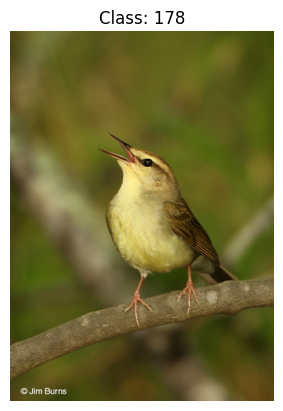

In [17]:
# ✅ Print First Image, Caption, and Class
first_img_id = sample_ids[0]  # Get first image ID
first_img_path = os.path.join(data_dir, "images", images[images["image_id"] == first_img_id]["file_path"].values[0])
first_class = labels_df[labels_df["image_id"] == first_img_id]["class_id"].values[0]
first_caption = llava_captions.get(str(first_img_id), {}).get("llava_text", "No description available.")

print(f"✅ First Image ID: {first_img_id}")
print(f"✅ First Image Path: {first_img_path}")
print(f"✅ First Class ID: {first_class}")
print(f"✅ First Caption: {first_caption}")

# ✅ Display the First Image
image = Image.open(first_img_path)
plt.imshow(image)
plt.axis("off")
plt.title(f"Class: {first_class}")
plt.show()


In [6]:
import pandas as pd
from IPython.display import display

# Show the results
display(df_results)


,img_id,cosine_sim_pretrained,cosine_sim_lora,improvement
0,10477,0.298437,0.985769,0.687331
1,1825,0.279611,0.955270,0.675659
2,410,0.287874,0.940413,0.652539
3,4507,0.291592,0.974556,0.682964
4,4013,0.289446,0.989367,0.699921
...,...,...,...,...
95,10486,0.289516,0.925277,0.635761
96,11275,0.283988,0.957366,0.673378
97,9126,0.288956,0.987110,0.698154
98,3599,0.288507,0.988256,0.699749


In [8]:
df_results.to_csv("/content/drive/MyDrive/Uni/Bird Exploration/clip_vs_lora_comparison.csv", index=False)
print("✅ Results saved as clip_vs_lora_comparison.csv")


✅ Results saved as clip_vs_lora_comparison.csv


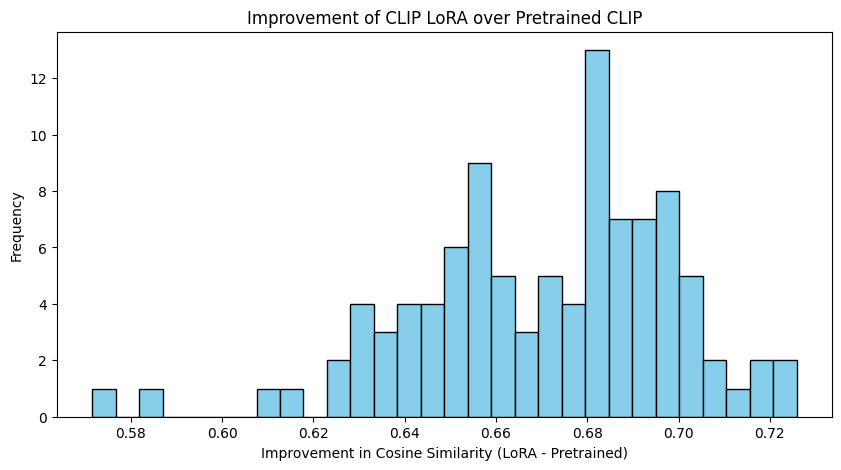

In [9]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 5))
plt.hist(df_results["improvement"], bins=30, color="skyblue", edgecolor="black")
plt.xlabel("Improvement in Cosine Similarity (LoRA - Pretrained)")
plt.ylabel("Frequency")
plt.title("Improvement of CLIP LoRA over Pretrained CLIP")
plt.show()
